

*   Reading an image
*   Extracting the RGB values of a pixel
*   Extracting the Region of Interest (ROI)
*   Resizing the Image
*   Rotating the Image
*   Drawing a Rectangle
*   Displaying text











In [ ]:
!pip install opencv--contrib--python

Height = 1603, Width = 2400


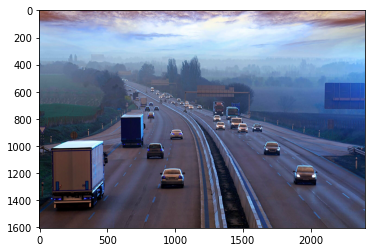

In [2]:
# Importing the OpenCV library
import matplotlib.pyplot as plt
import cv2
# Reading the image using imread() function
image = cv2.imread('download.jpg')

# Extracting the height and width of an image
h, w = image.shape[:2]
# Displaying the height and width
print("Height = {}, Width = {}".format(h, w))
plt.imshow(image)
plt.show()

In [15]:
# Extracting the height and width of an image
h = image.shape[0] # height
w = image.shape[1] #width
bands = image.shape[2] #layers
h , w, b = image.shape
print(h)
print(w)
print(b, '\n')
print(h, w, b)

1603
2400
3 

1603 2400 3


In [4]:
image.max()

255

In [5]:
image.min()

0

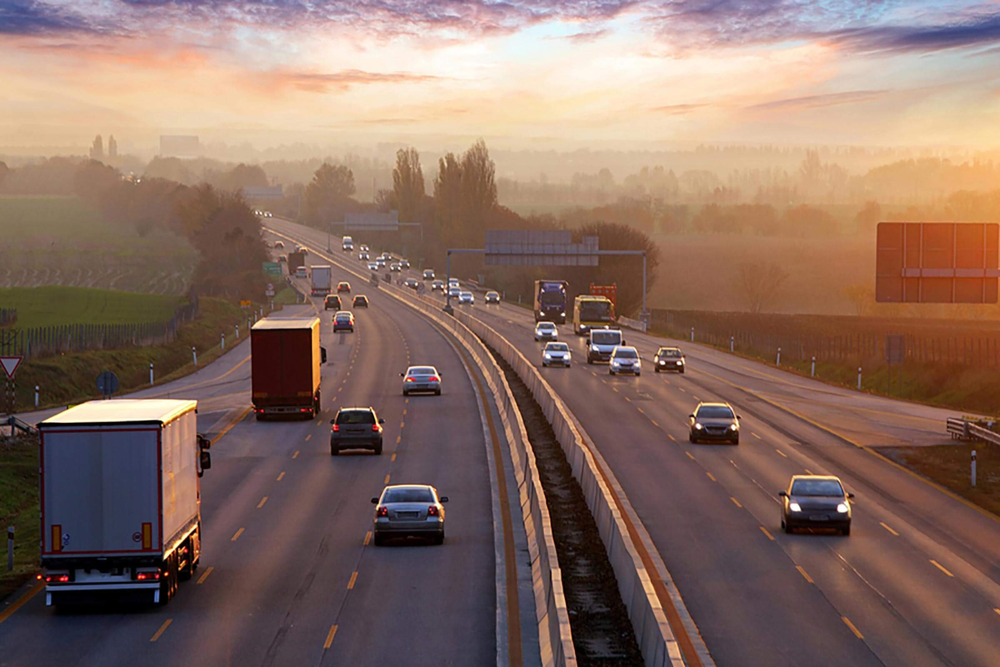

Now we will focus on extracting the RGB values of an individual pixel.
Note – OpenCV arranges the channels in BGR order. So the 0th value will correspond to Blue pixel and not Red.

R = 211, G = 172, B = 165
B = 165


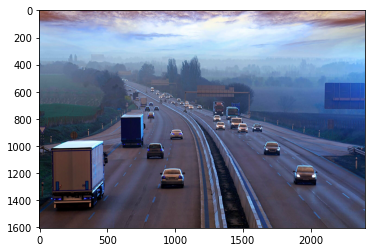

In [10]:
#Extracting the RGB values of a pixel
# Extracting RGB values.
# Here we have randomly chosen a pixel
# by passing in 100, 100 for height and width.
(B, G, R) = image[100, 100]  # image[150,95]

# Displaying the pixel values
print("R = {}, G = {}, B = {}".format(R, G, B))

# We can also pass the channel to extract
# the value for a specific channel
B = image[100, 100, 0]
print("B = {}".format(B))
plt.imshow(image)
plt.show()

In [14]:
#Extracting the Region of Interest (ROI)

# We will calculate the region of interest
# by slicing the pixels of the image
roi = image[100 : 500, 200 : 700]

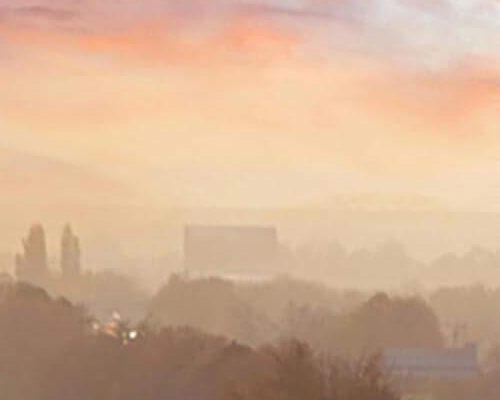

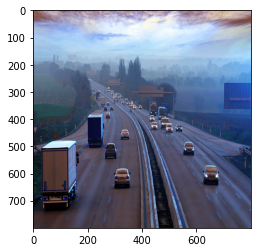

In [ ]:
#Resizing the Image

# resize() function takes 2 parameters,
# the image and the dimensions
resize = cv2.resize(image, (800, 800))
plt.imshow(resize)
plt.show()


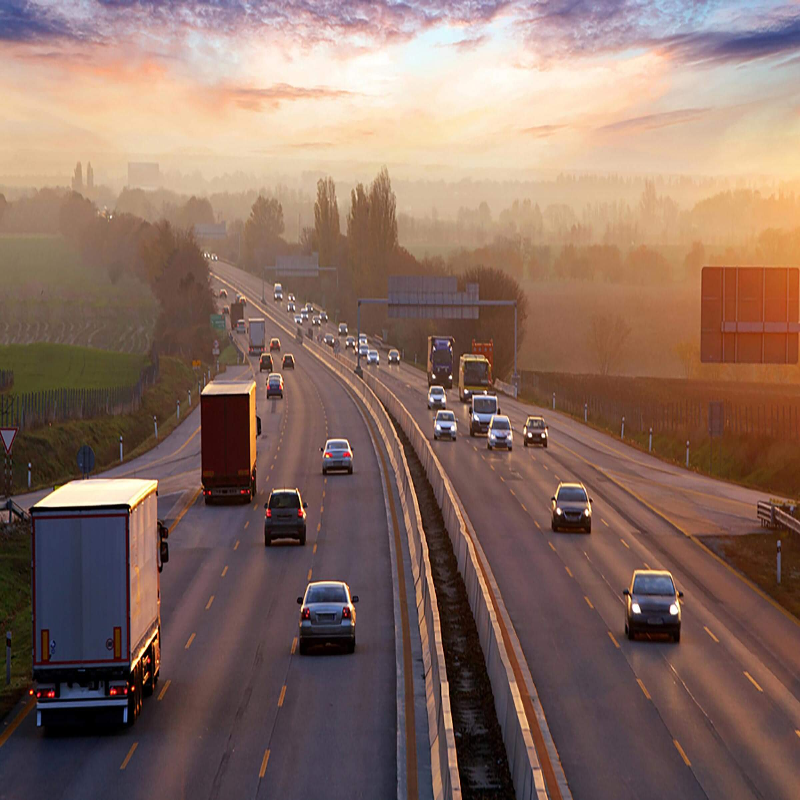

The problem with this approach is that the aspect ratio of the image is not maintained. So we need to do some extra work in order to maintain a proper aspect ratio.

In [ ]:
# Calculating the ratio
ratio = 800 / w

# Creating a tuple containing width and height
dim = (800, int(h * ratio))

# Resizing the image
resize_aspect = cv2.resize(image, dim)


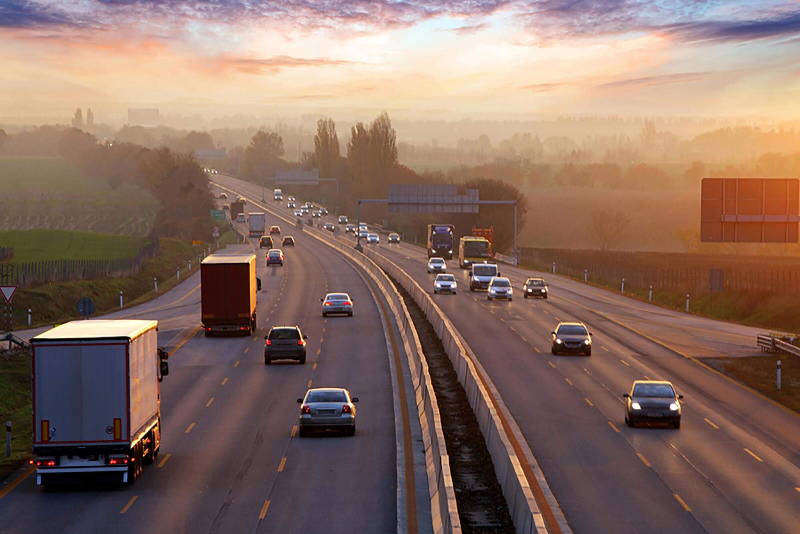

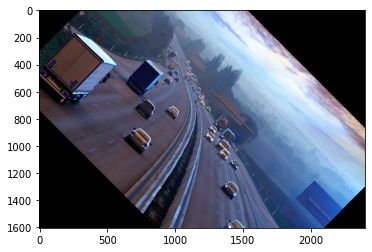

In [ ]:
#Rotating the Image

# Calculating the center of the image
center = (w // 2, h // 2)

# Generating a rotation matrix
matrix = cv2.getRotationMatrix2D(center, -45, 1.0)

# Performing the affine transformation
rotated = cv2.warpAffine(image, matrix, (w, h))
plt.imshow(rotated)
plt.show()

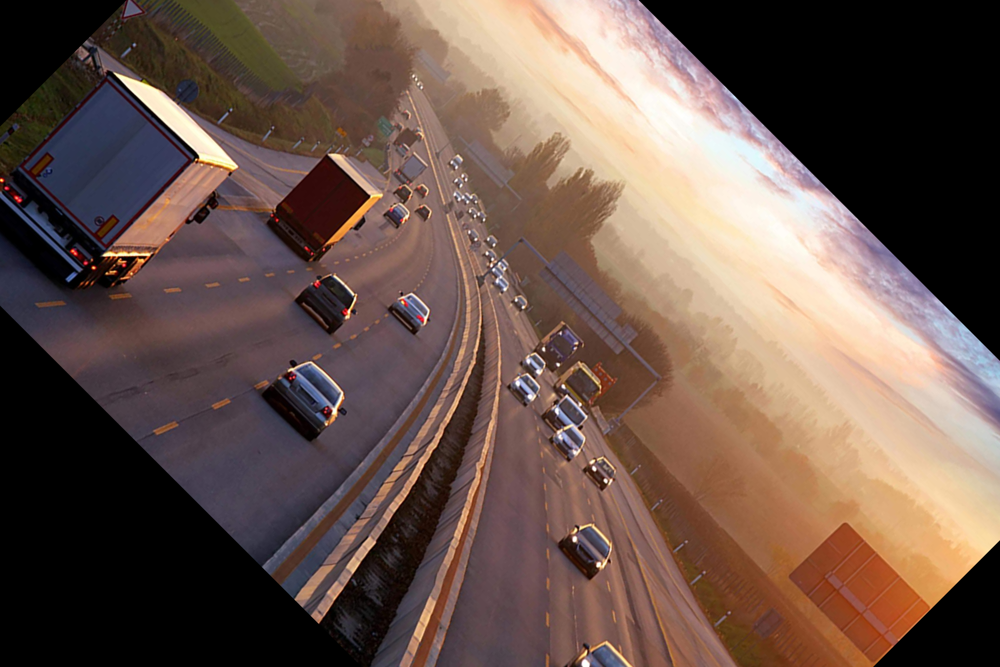

There are a lot of steps involved in rotating an image. So, let me explain each of them in detail.

The 2 main functions used here are –



*   getRotationMatrix2D()
*   warpAffine()




getRotationMatrix2D()
It takes 3 arguments –

* center – The center coordinates of the image
* Angle – The angle (in degrees) by which the image should be rotated
* Scale – The scaling factor
 
It returns a 2*3 matrix consisting of values derived from alpha and beta
alpha = scale * cos(angle)
beta = scale * sine(angle)

* warpAffine()

The function warpAffine transforms the source image using the rotation matrix:

dst(x, y) = src(M11X + M12Y + M13, M21X + M22Y + M23)

Here M is the rotation matrix, described above.
It calculates new x, y co-ordinates of the image and transforms it.

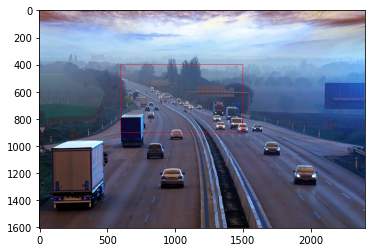

In [ ]:
#Drawing a Rectangle
#It is an in-place operation.

# We are copying the original image,
# as it is an in-place operation.
output = image.copy()

# Using the rectangle() function to create a rectangle.
rectangle = cv2.rectangle(output, (1500, 900),(600, 400), (255, 0, 0), 2)
plt.imshow(rectangle)
plt.show()

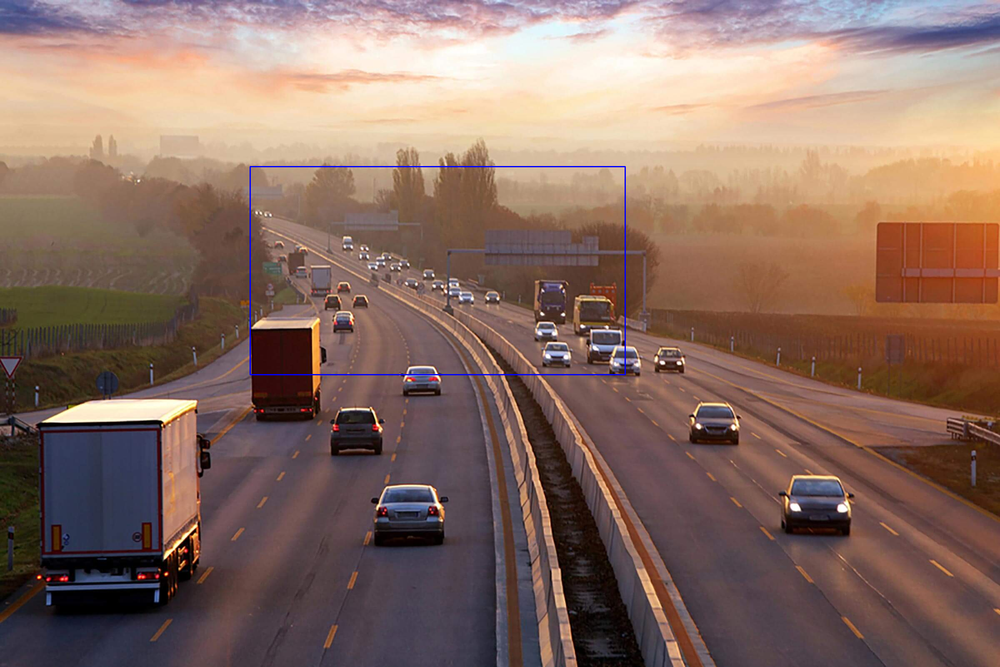

It takes in 5 arguments –

* Image
* Top-left corner co-ordinates
* Bottom-right corner co-ordinates
* Color (in BGR format)
* Line width

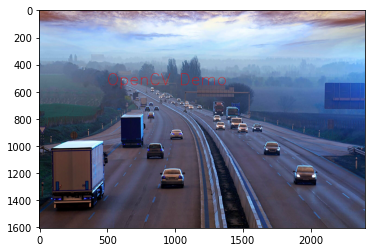

In [ ]:
#Displaying text
#It is also an in-place operation

# Copying the original image
output = image.copy()

# Adding the text using putText() function
text = cv2.putText(output, 'OpenCV Demo', (500, 550),
				cv2.FONT_HERSHEY_SIMPLEX, 4, (255, 0, 0), 2)
plt.imshow(text)
plt.show()

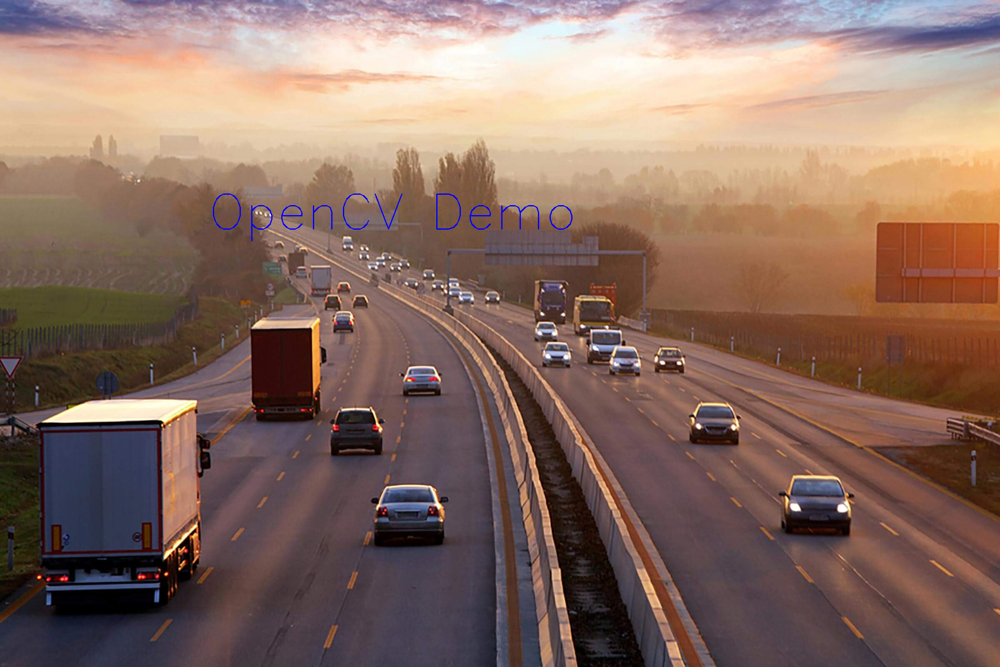

It takes in 7 arguments –

* Image
* Text to be displayed
* Bottom-left corner co-ordinates, from where the text should start
* Font
* Font size
* Color (BGR format)
* Line width